# **Ejercicio 2**
###Análisis Descriptivo y Exploratorio de Dataframes sobre Tipos de Cambio y Turismo en Argentina

## Enunciado

El propósito de este ejercicio es realizar un análisis descriptivo y exploratorio de dos dataframes, relacionados con los tipos de cambio oficial y paralelo en Argentina y la cantidad de turistas que
llegaron desde países limítrofes.

El análisis permitirá conocer mejor la distribución de las variables y
las posibles relaciones entre ellas, asegurando que los datos sean precisos y confiables antes de continuar con el análisis.

**Instrucciones**:

1. Importar los dos dataframes desde el archivo "tc_turistas.xlsx": un dataframe con datos diarios
de tipos de cambio oficial y paralelo en Argentina durante el período de junio de 2017 a
febrero de 2020, y otro con la cantidad de turistas que llegaron desde países limítrofes en
frecuencia mensual.

2. Ajustar la frecuencia del dataframe de tipos de cambio a mensual, para que sea compatible con
el dataframe de turistas.

3. Explorar ambos dataframes mediante gráficos y medidas de resumen. Verificar la distribución
de las variables, la presencia de valores faltantes o extremos, y las correlaciones entre las
variables.

4. Realizar un análisis exploratorio de los datos para conocer mejor la distribución de los mismos y
las posibles relaciones entre las variables.

5. Si se encuentra algún problema en los datos, determine la mejor manera de solucionarlo.
Verificar que los datos sean precisos y confiables antes de continuar con el análisis.

6. Realizar cualquier tarea de limpieza o curación de los datos que sea necesaria para asegurar la
calidad de la información.

7. Presentar los hallazgos y conclusiones del análisis, destacando cualquier patrón o tendencia
que resulte relevante y contribuya a una mayor comprensión de las relaciones entre las
variables estudiadas.

8. Escribir el informe incluyendo código Python utilizado, las visualizaciones y las conclusiones en
un cuaderno Google Colab. El dataframe final curado debe ser exportado a formato .parquet.

--- 

### Datos

Los datasest utilizados en esta notebook se pueden descargar de los links correspondientes

Link al dataset con valores del dolar e información sobre los turistas:
- tc_turistas: [xlsx](https://docs.google.com/spreadsheets/d/1urvsTCHvWvTjWHCa_MY0g9IKLw39EVqk/edit?usp=sharing&ouid=100279809176937514275&rtpof=true&sd=true)

Link a tres archivos que permiten graficar y obtener información geográfica de los paises. 
*NOTA*: Los tres archivos son necesarios a pesar de que solo uso es llamado en el código. Deben pertecer a la misma carpeta (/content)
- World_Countries: [dbf](https://drive.google.com/file/d/1bCr0EFDnsD6c9p_CTIml79iin1hWu9O7/view?usp=sharing)

- World_Countries: [shp](https://drive.google.com/file/d/1yA7WVvd8KsH1lANxVf5GPhRjaA8LJ0wy/view?usp=sharing)

- World_Countries: [shx](https://drive.google.com/file/d/1LrREJQ6VyZB8m5qBEmez36XeR2Ds5cii/view?usp=sharing)

### Importación

Las siguiente celdas de código son necesarias de ejecutar para importar las librerias que permitaran manipular y visualizar los datos otorgados desde Python.

In [ ]:
!pip install pycountry-convert
!pip install geopy
!pip install folium
!pip install geopandas
!pip install imageio

import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from pycountry_convert import country_alpha2_to_continent_code, country_name_to_country_alpha2
from geopy.geocoders import Nominatim
import folium
from folium.plugins import MarkerCluster
import imageio
import os
from IPython.display import Image, display, clear_output
from matplotlib import cm
from matplotlib.ticker import FixedLocator, FixedFormatter

clear_output()

## Dolar

In [ ]:
dollar = pd.read_excel("tc_turistas.xlsx", sheet_name=0)
dollar.head(5)

,FECHA,DOLAR Oficial,DOLAR Blue
0,2017-06-01,16.25,16.30
1,2017-06-02,16.20,16.32
2,2017-06-03,NaN,NaN
3,2017-06-04,NaN,NaN
4,2017-06-05,16.20,16.34


Con los siguiente comandos se renombraran las columnas de la primer tabla sobre el valor del dolar a lo largo del tiempo.

Además, se obtiene información general sobre el dataset.

In [ ]:
# renombrar las columnas
dollar.columns = ['date', 'official', 'blue']

print(dollar.info(), "\n")

print("Cantidad de valores nulos por columna")
print(dollar.isnull().sum(), '\n')

print("Tamaño de la tablas: ", dollar.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1004 entries, 0 to 1003
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      1004 non-null   datetime64[ns]
 1   official  668 non-null    float64       
 2   blue      671 non-null    float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 23.7 KB
None 

Cantidad de valores nulos por columna
date          0
official    336
blue        333
dtype: int64 

Tamaño de la tablas:  (1004, 3)


Se realiza un interpolación en ambas columnas sobre el precio del dolar. Esto con el objetivo de rellenar los valores nulos faltantes. La interpolación es apropiada ya que los valores se rellenan en base a valores cercanos a su fecha, y no en base a todo el conjunto en general.

In [ ]:
# se rellenan los valores nulos
dollar['official'] = dollar['official'].interpolate()
dollar['blue'] = dollar['blue'].interpolate().round(2)

# reordena las columnas
dollar = dollar[['date', 'official', 'blue']]

## Dolar Oficial vs Blue

Veamos en un grafico como cambian a lo largo del tiempo los precios del dolar, comparando ambos tipos, considerando el precio del dolar al primer día de cada mes.
La eleccion del primer día del mes se debe a que en el dataset sobre turistas, los registros son mensuales registrando el primer dia de cada mes.

La ejecución de la siguiente celda puede ser tardia debido a la cantidad de gráficos que genera.

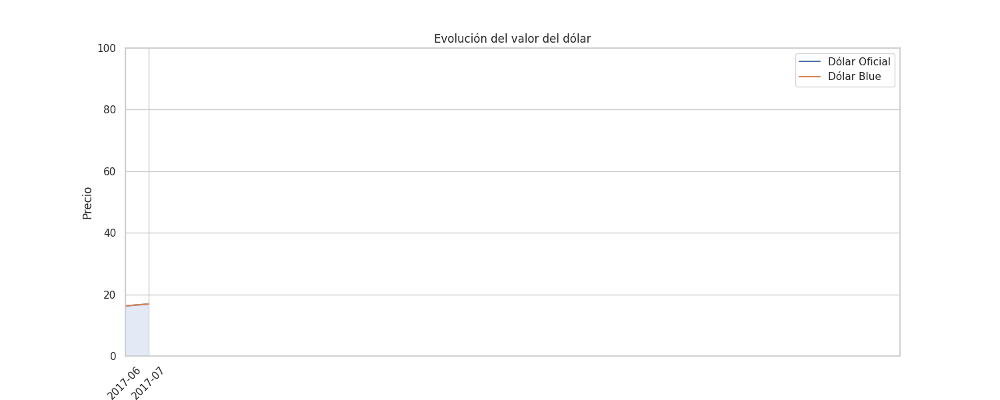

In [ ]:
def generate_linechart_plot(dollar_by_month, output_directory, i):
    '''Genera un line chart doble date vs dollar'''
    # acumula valores del dataframe de 0 a la ieracion actual
    official = dollar_by_month.official[0:i]
    blue = dollar_by_month.blue[0:i]
    x = dollar_by_month.date.astype(str)[0:i]

    # configuraciones de grafico
    plt.figure(figsize=(15, 6))
    plt.plot(official)
    plt.plot(blue)
    plt.fill_between(range(i), official, color=colors[0], alpha=0.5)
    plt.fill_between(range(i), blue, color=colors[1], alpha=0.5)
    plt.ylim(0, 100)
    plt.xlim(0, 33)
    plt.xticks(range(i), x, rotation=45)
    plt.title('Evolución del valor del dólar')
    plt.xlabel('Fecha')
    plt.ylabel('Precio')
    plt.legend(['Dólar Oficial', 'Dólar Blue'])
    plt.savefig(os.path.join(output_directory, f'line-{i}.png'))
    plt.close()

def generate_intermediate_plots(dollar_by_month, output_directory, i, n):
    ''' genera graficos similares a generate_linechart_plot, pero interpolando los valores
    para agregar mas frames a la animacion con el fin de suavizar la transicion'''
    # seleccion de rangos de valores
    official_start = dollar_by_month.official[i-1]
    official_end = dollar_by_month.official[i]
    blue_start = dollar_by_month.blue[i-1]
    blue_end = dollar_by_month.blue[i]
    x = dollar_by_month.date.astype(str)[0:i]

    # genera line charts interpolando los valores entre dos fechas
    for j in range(1, n+1):
        official = np.linspace(official_start, official_end, n+1)[j]
        blue = np.linspace(blue_start, blue_end, n+1)[j]
        plt.figure(figsize=(15, 6))
        plt.plot(range(i-1), dollar_by_month.official[0:i-1])
        plt.plot(range(i-1), dollar_by_month.blue[0:i-1])
        plt.plot(i-1+j/n, official, 'o', color=colors[0])
        plt.plot(i-1+j/n, blue, 'o', color=colors[1])
        plt.fill_between(range(i), np.append(dollar_by_month.official[0:i-1], official), 0, color=colors[0], alpha=0.5)
        plt.fill_between(range(i), np.append(dollar_by_month.blue[0:i-1], blue), 0, color=colors[1], alpha=0.5)
        plt.ylim(0, 100)
        plt.xlim(0, 33)
        plt.xticks(range(i), x, rotation=45)
        plt.title('Evolución del valor del dólar')
        plt.xlabel('Fecha')
        plt.ylabel('Precio')
        plt.legend(['Dólar Oficial', 'Dólar Blue'])
        plt.savefig(os.path.join(output_directory, f'line-{i}-{j}.png'))
        plt.close()

# Se agrupa por mes el valor del dólar tomando el primer valor de cada mes
dollar_by_month = dollar.groupby(dollar['date'].dt.to_period('M')).first()
dollar_by_month = dollar_by_month[['official', 'blue']].round(2).reset_index()

# definiciones para el grafico/gif
np.random.seed(0)
SIZE = 33
sns.set(style='whitegrid')
colors = ['#FFC8D8', '#C8F0FF']
output_directory = '/content/dollar-gif'

# Crea una nueva carpeta en caso de que no exista para guardar las imágenes generadas
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# crea un plot donde se acumula la fecha actual con los respectivos valores del dólar
for i in range(2, SIZE+1):
    generate_linechart_plot(dollar_by_month, output_directory, i)
    if i < SIZE:
        generate_intermediate_plots(dollar_by_month, output_directory, i, 5) # 5 intermediate frames

# se guarda el gif en la carpeta
gif_path = os.path.join(output_directory, 'dollar.gif')

# Maniulacion de la duracion de tiempo del gif
n_frames = SIZE - 1 + 5 * (SIZE - 2)
durations = [0.05] * (n_frames - 1) + [5] + [0.05]

# Proceso de creacion del gif a partir de los plots
with imageio.get_writer(gif_path, mode='I', duration=durations) as writer:
    for i in range(2, SIZE+1):
        image = imageio.imread(os.path.join(output_directory, f'line-{i}.png'))
        writer.append_data(image)
        if i < SIZE:
            for j in range(1, 6):
                image = imageio.imread(os.path.join(output_directory, f'line-{i}-{j}.png'))
                writer.append_data(image)
    image = imageio.imread(os.path.join(output_directory, f'line-{SIZE}.png'))
    writer.append_data(image)

# mostrar el gif como salida
clear_output()
display(Image(filename=gif_path))

## Turistas y Curación de los datos

In [ ]:
tourists = pd.read_excel("tc_turistas.xlsx", sheet_name=2)
tourists.head(5)

,anio,mes,date,Bolivia,Brasil,Chile,Paraguay,Uruguay
0,2013,ene,2013-01-01,141417.46,112996.623524,66007.699999,50277.720853,52456.413939
1,2013,feb,2013-02-01,95204.26,161366.098439,62013.313451,52666.951095,41377.875955
2,2013,mar,2013-03-01,82862.06,96727.365114,81096.057038,92714.958474,43728.713276
3,2013,abr,2013-04-01,72009.46,66978.888460,55096.585327,67716.242304,27458.646062
4,2013,may,2013-05-01,79131.44,63886.966089,61641.446807,70544.694702,23592.398421


Pueden notarse las siguientes aclaraciones:
- La cantidad de turistas de cada país esta en formato decimal, cuando deberia ser formato entero. Para ello, ignoramos la parte decimal, tal como lo aclara la metadata.
- La columna `mes` esta en formato string con las iniciales del nombre de cada mes. Para que haya coincidencia con el formato numerico del dataframe `cambio` se debe transformar.
- Las columnas `anio` y `mes` son innecesarias, debido a que en la columna `date` ya se pueden determinar los correpondientes periodos.  
- El rango de fechas es mayor a los datos otorgados sobre el dolar, por lo que debera ser filtrado.

In [ ]:
# reorganizacion del dataframe
tourists = tourists[['date', 'Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']]

# ignoremos que cada fecha tiene el dia 1, y filtremos por el rango de interes
tourists['date'] = tourists['date'].dt.to_period('M')
filtered_tourists = tourists[(tourists['date'] >= '2017-06') & (tourists['date'] <= '2020-02')]

# ignoremos los decimales de la cantidad de turistas
filtered_tourists[['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']] = tourists[['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']].astype(int)
clear_output()

Indagando en los datos del dataframe `filtered_tourists` podemos notar un valor muy atípico (se ignora aqui, pero se nota al mostrar y ordenar el dataframe). En la siguiente celda se muestra su proporción de acuerdo a los demas valores.

La causa mas probable es por error del formato decimal con el que venia previamente cargado el dataset.

Se puede determinar que una fecha similar (registro 64) se tiene el valor 59305 para Chile. Por lo que podemos suponer que 571838802363218 en realidad refiere a 57183.

***IMPORTANTE***: Para apreciar la diferencia entre los gráficos, esta celda debe ejecutarse una única vez luego de ejecutar las celdas anteriores.

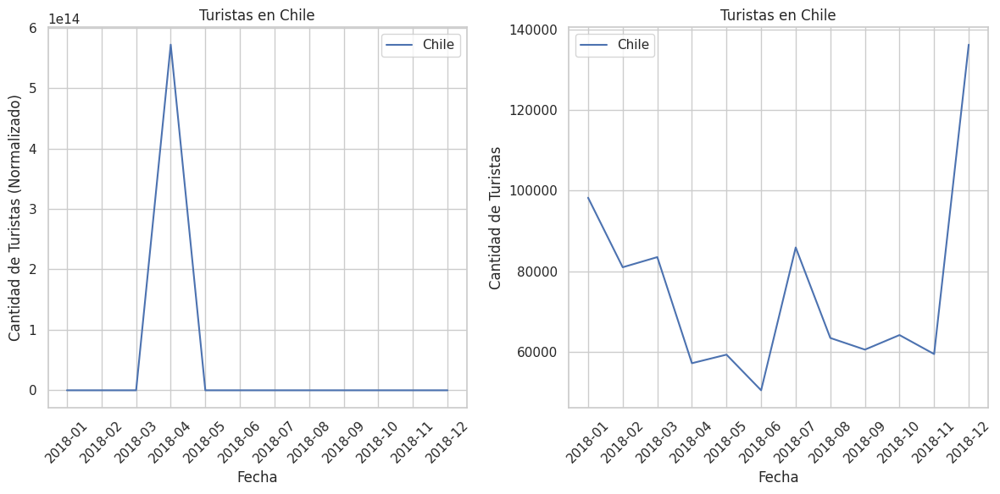

In [ ]:
# Filtrar por fecha y país del outlier
chile_2018 = filtered_tourists[(filtered_tourists['date'] >= '2018-01') & (filtered_tourists['date'] <= '2018-12')]

chile_2018.date = chile_2018.date.astype(str)
chile_2018 = chile_2018[['date', 'Chile']]

# Graficar los datos de Chile (primer gráfico)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))  # Crear una figura con 1 fila y 2 columnas
ax[0].plot(chile_2018['date'], chile_2018.Chile, label='Chile')  # Graficar en el primer subplot

# Etiquetas de los ejes y título del primer gráfico
ax[0].set_xlabel('Fecha')
ax[0].set_ylabel('Cantidad de Turistas (Normalizado)')
ax[0].set_title('Turistas en Chile')
ax[0].set_xticks(chile_2018.date)
ax[0].tick_params(axis='x', rotation=45)
ax[0].legend()

# Cambiar el valor de 571838802363218 a 57183
filtered_tourists.Chile.loc[63] = 57183

# configuraciones del segundo grafico
chile_2018 = filtered_tourists[(filtered_tourists['date'] >= '2018-01') & (filtered_tourists['date'] <= '2018-12')]

chile_2018.date = chile_2018.date.astype(str)
chile_2018 = chile_2018[['date', 'Chile']]

# Graficar los datos de Chile (segundo gráfico)
ax[1].plot(chile_2018['date'], chile_2018.Chile, label='Chile')  # Graficar en el segundo subplot

# Etiquetas de los ejes y título del segundo gráfico
ax[1].set_xlabel('Fecha')
ax[1].set_ylabel('Cantidad de Turistas')
ax[1].set_title('Turistas en Chile')
ax[1].set_xticks(chile_2018.date)
ax[1].tick_params(axis='x', rotation=45)
ax[1].legend()

plt.tight_layout()  # Ajustar el espaciado entre los subplots
clear_output()
plt.show()

Podemos probar que ahora `grp_by_month` y `filtered_tourist` tiene la misma cantidad de registros, pues contamos con el mismo periodo de tiempo agrupado por mes. Podemos unir ambos dataframes para poder estudiar la relación de sus variables.

In [ ]:
print("tamaño de los dataframes: ", dollar_by_month.shape, filtered_tourists.shape, '\n')

merged = pd.merge(dollar_by_month, filtered_tourists, on='date', how='inner')
print("Nuevo tamaño del dataset: ", merged.shape)

merged.head(5)

tamaño de los dataframes:  (33, 3) (33, 6) 

Nuevo tamaño del dataset:  (33, 8)


,date,official,blue,Bolivia,Brasil,Chile,Paraguay,Uruguay
0,2017-06,16.25,16.30,91354,44950,51901,44105,22149
1,2017-07,16.87,16.86,139655,67292,90150,74440,25872
2,2017-08,17.78,17.47,101980,53708,67773,60127,26348
3,2017-09,17.40,18.15,113370,79188,66416,70244,20974
4,2017-10,17.57,17.94,108988,86278,74250,65150,27705


## Métricas Generales

Los datos a este punto parecen consistentes. Veamos en boxplots las medidas de localización.

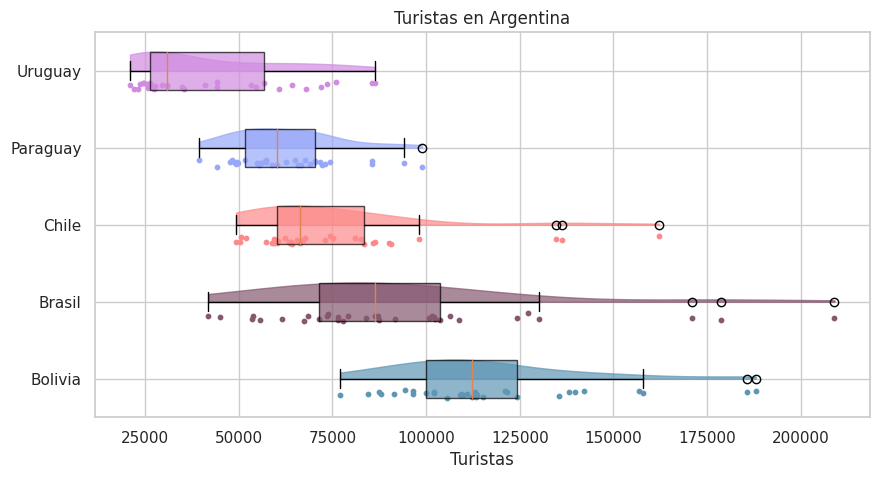

In [ ]:
# Preparar el gráfico
fig, ax = plt.subplots(figsize=(10, 5))

# Colores personalizados para boxplots, violin plots y scatter plots
boxplots_colors = ['#6096B4', '#85586F', '#FD8A8A', '#98A8F8', '#D18CE0']
violin_colors = ['#6096B4', '#85586F', '#FD8A8A', '#98A8F8', '#D18CE0']
scatter_colors = ['#6096B4', '#85586F', '#FD8A8A', '#98A8F8', '#D18CE0']

# Dibujar boxplots
bp = ax.boxplot(merged[['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']], patch_artist=True, vert=False)
for patch, color in zip(bp['boxes'], boxplots_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Dibujar violin plots
vp = ax.violinplot(merged[['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']], points=500, showmeans=False, showextrema=False, showmedians=False, vert=False)
for idx, b in enumerate(vp['bodies']):
    b.get_paths()[0].vertices[:, 1] = np.clip(b.get_paths()[0].vertices[:, 1], idx + 1, idx + 2)
    b.set_color(violin_colors[idx])
    b.set_alpha(0.7)

# Dibujar scatter plots
for idx, column in enumerate(['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']):
    y = np.full(len(merged[column]), idx + .8) + np.random.uniform(low=-.05, high=.05, size=len(merged[column]))
    plt.scatter(merged[column], y, s=10, c=scatter_colors[idx])

# Configurar las etiquetas y el título del gráfico
countries = ['Bolivia', 'Brasil', 'Chile', 'Paraguay', 'Uruguay']
plt.yticks(np.arange(1, len(countries) + 1, 1), countries)
plt.xlabel('Turistas')
plt.title("Turistas en Argentina")
# Mostrar el gráfico
plt.show()

Podemos ver que en su mayoria los datos se comportan esperada, y decir por ejemplo que Brasil y Bolivia son los paises que mas frecuentan Argentina en nuestro dataset debido su posicion en el gráfico. Pero que ocurre con los valores atipicos en Brasil y Chile que resultan alejarse tanto de sus rangos hacia la derecha?

Veamos si podemos determinar la causa de dichos valores. Se debe a la epoca vacacional? a la pronta llegada de la pandemia? O quiza a dichos turistas les resulta favorable el cambio de modena debido a la subida del dolar en dicho periodo. Veamoslo en los siguientes graficos.

El siguiente gráfico tiene intención de relacionar la cantidad de turistas con el precio del dolar a lo largo del periodo de tiempo.

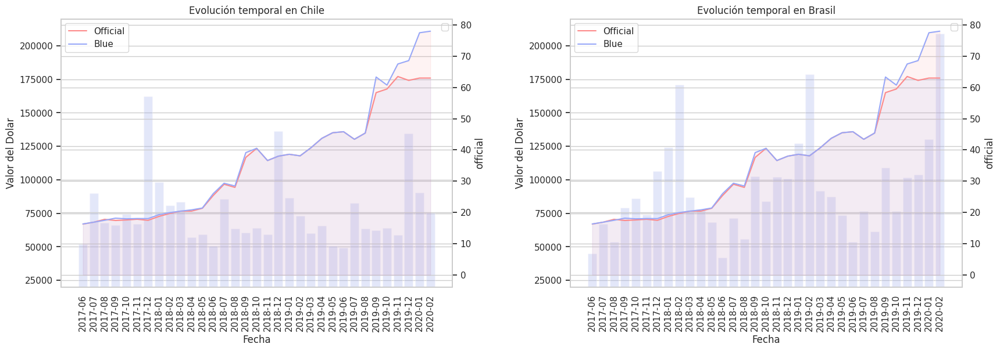

In [ ]:
# Selecciona las columnas relevantes para los gráficos
columnas_paises = ['official', 'blue', 'Chile', 'Brasil']

# Configuración estética
sns.set(style="whitegrid")
colors = ['#6096B4', '#85586F', '#FD8A8A', '#98A8F8', '#D18CE0']

# Configuración de la figura
fig, axes = plt.subplots(nrows=1, ncols=len(columnas_paises[2:]), figsize=(20, 6))
plt.subplots_adjust(wspace=0.3) # Espacio entre gráficos

# Itera sobre cada país y crea un gráfico para cada uno
for i, pais in enumerate(columnas_paises[2:]):
    ax = axes[i]

    # Gráfico de barras para representar turistas
    sns.barplot(x=merged['date'].astype(str), y=merged[pais], color=colors[3], ax=ax, alpha=0.3)
    # Limita la escala del eje y
    ax.set_ylim(20000, 220000)

    # Crea un eje y secundario
    ax2 = ax.twinx()

    # Gráfico de líneas suavizadas para official y blue en el eje y secundario
    sns.lineplot(x=merged['date'].astype(str), y=merged['official'], color=colors[2], label='Official', ax=ax2)
    sns.lineplot(x=merged['date'].astype(str), y=merged['blue'], color=colors[3], label='Blue', ax=ax2)

    # Relleno entre las líneas blue y official con el eje x
    ax2.fill_between(merged['date'].astype(str), merged['blue'], color=colors[2], alpha=0.1)
    ax2.fill_between(merged['date'].astype(str), merged['official'], color=colors[3], alpha=0.1)

    ax.set_xlabel('Fecha')
    ax.set_ylabel('Valor del Dolar')
    ax.set_title(f'Evolución temporal en {pais}')
    ax.legend()
    ax.set_xticklabels(merged['date'].dt.strftime('%Y-%m'), rotation=90) # Rotar etiquetas del eje x

clear_output()
plt.show()

En estos gráficos nos concentramos solo en Brasil y Chile ya que presentaban valores atípicos grandes.

Podemos ver en el gráfico de la izquierda que los valores atípicos en Chile provienen del periodo de diciembre de 2017. Vemos que este patrón se repite en los siguientes años. Dicho caso puede deberse a que el cambio de moneda favorecia economicamente a la población chilena cuando habia poca diferencia entre el dolar oficial y el dolar blue.

Por el contrario, la tendencia es contraria en el caso de turistas brasileros, ya que a medida que el dolar blue se eleva sobre el precio del dolar oficial, la cantidad de turistas aumenta. Además tambien hay una marcada tendencia en la llegada de turistas en epocas de verano.

## Mapa de Turistas

Veamos un mapa animado la proporción de turistas de los paises limitrofes que visitan Argentina a lo largo del periodo de tiempo.

La ejecución de las siguientes celdas puede ser tardía debido a la cantidad de información que se procesa.

La siguiente celda define funciones para obtener el codigó de pais, continente y coordenadas de cada país. Se utiliza en la celda posterior para agregar esta información al dataframe

In [ ]:
# Obtener el codigo del pais y continente en base a su nombre
def get_continent(col):
    try:
        cn_a2_code = country_name_to_country_alpha2(col)
    except:
        cn_a2_code = 'Unknown'
    try:
        cn_continent = country_alpha2_to_continent_code(cn_a2_code)
    except:
        cn_continent = 'Unknown'
    return (cn_a2_code, cn_continent)

# Obtener las coordenadas de cada pais
geolocator = Nominatim(user_agent="fabiogiampaoli21@gmail.com")

def geolocate(country):
    try:
        loc = geolocator.geocode(country)
        return (loc.latitude, loc.longitude)
    except:
        return np.nan

Es la siguiente celda de código se crea un dataframe con los datos proporcionados, pero transpuestos, ya que al principio resultaba mas fácil para unir al dataset datos geográficos de los paises. Luego de algunas modificaciones resulo que no era necesario, pero de todos modos se continuo con este modelo debido al avanze hasta el momento.

In [ ]:
# obtiene la transpuesta del dataframe
transformed = merged.T
transformed.columns = transformed.iloc[0]
transformed = transformed[1:]
transformed = transformed.rename(index={"Brasil": "Brazil"})

transformed_dollar = transformed.loc[["official", "blue"]]

# Crear un nuevo dataframe con los nombres de los países como índice
transformed_countries = transformed.drop(["official", "blue"])

# Reiniciar el índice para que sea autonumerado y agregar la columna "Country"
transformed_countries = transformed_countries.reset_index()
transformed_countries = transformed_countries.rename(columns={"index": "Country"})

transformed_dollar = transformed_dollar.reset_index()
transformed_dollar = transformed_dollar.rename(columns={"index": "Dollar"})

# agrego Argentina para visualizarlo en el mapa
transformed_countries.loc[len(transformed_countries)] = ["Argentina"] + [0] * (len(transformed_countries.columns) - 1)

# agrego el codigo de pais y continente para busqueda
transformed_countries['country_code'], transformed_countries['continent'] = zip(*transformed_countries['Country'].map(get_continent))

# agrego las coordenadas de cada pais
transformed_countries['latitude'] = transformed_countries['Country'].apply(geolocate).str[0]
transformed_countries['longitude'] = transformed_countries['Country'].apply(geolocate).str[1]
transformed_countries['coordinates'] = transformed_countries[['latitude', 'longitude']].apply(tuple, axis=1)

# transformo los nombres de las columnas que son period[M] data type a string
transformed_countries.columns = transformed_countries.columns.astype(str)
transformed_dollar.columns = transformed_dollar.columns.astype(str)

display(transformed_countries)
display(transformed_dollar)

date,Country,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,...,2019-10,2019-11,2019-12,2020-01,2020-02,country_code,continent,latitude,longitude,coordinates
0,Bolivia,91354,139655,101980,113370,108988,100106,113630,156813,96556,...,110797,109850,135503,185654,109344,BO,SA,-17.056870,-64.991229,"(-17.0568696, -64.9912286)"
1,Brazil,44950,67292,53708,79188,86278,73925,106258,124143,170947,...,76538,101498,103795,130090,208970,BR,SA,-10.333333,-53.200000,"(-10.3333333, -53.2)"
2,Chile,51901,90150,67773,66416,74250,67212,162180,98232,80980,...,63888,59000,134728,90585,75102,CL,SA,-31.761336,-71.318770,"(-31.7613365, -71.3187697)"
3,Paraguay,44105,74440,60127,70244,65150,58810,54931,47638,49857,...,72198,70456,65900,62637,68968,PY,SA,-23.316593,-58.169345,"(-23.3165935, -58.1693445)"
4,Uruguay,22149,25872,26348,20974,27705,41117,53165,72066,56729,...,29528,44103,73510,85464,75996,UY,SA,-32.875555,-56.020153,"(-32.8755548, -56.0201525)"
5,Argentina,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,AR,SA,-34.996496,-64.967282,"(-34.9964963, -64.9672817)"


date,Dollar,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,...,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01,2020-02
0,official,16.25,16.87,17.78,17.4,17.57,17.8,17.45,18.71,19.65,...,45.5,45.83,43.4,45.4,58.33,59.5,63.5,62.25,63.0,63.0
1,blue,16.3,16.86,17.47,18.15,17.94,18.03,18.01,19.26,19.93,...,45.5,45.83,43.4,45.4,63.33,60.75,67.5,68.58,77.5,78.0


Esta celda utilizara un archivo que permite graficar la forma de los paises. Se une al dataset de turistas y luego se generan mapas, que se unen como frames para generar un gráfico animado del mapa.

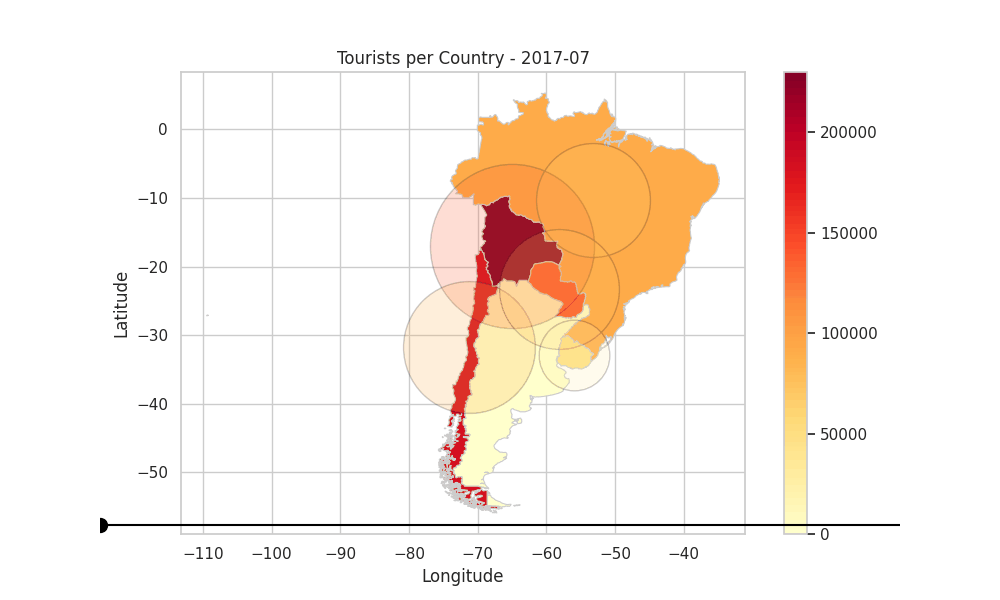

In [ ]:
# Cargar el archivo shape de los países del mundo
world = gpd.read_file('World_Countries.shp')

# Seleccionar solo las columnas de fechas para el mapa
dates_columns = transformed_countries.columns[2:18] 

# Número de frames intermedios a agregar entre cada fecha
intermediate_frames = 5

def generate_map(frame_number):
    ''' Genera un mapa de los paises donde el color lo representa la cantidad de turistas de la fecha.'''
    # carga de los datos
    current_date = dates_columns[frame_number]
    mapp = world.merge(transformed_countries[['Country', current_date]], left_on='COUNTRY', right_on='Country', how='left')
    # configuraciones del grafico
    fig, ax = plt.subplots(figsize=(10, 6))
    mapp.plot(column=current_date, cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
    plt.title('Tourists per Country - ' + current_date)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    # genera una linea de escala que sirve de leyenda
    sm = plt.cm.ScalarMappable(cmap='YlOrRd', norm=plt.Normalize(vmin=0, vmax=230000))
    sm._A = []
    cbar = fig.colorbar(sm)
    # Dibujar un círculo sobre cada país
    for _, row in transformed_countries.iterrows():
        ax.scatter(row['longitude'], row['latitude'], s=row[current_date] / 10, c=[sm.to_rgba(row[current_date])], alpha=0.2, edgecolors='black')
    # Agregar una línea de tiempo
    ax2 = fig.add_axes([0.1, 0.1, 0.8, 0.05])
    ax2.set_xlim(0, len(dates_columns) - 1)
    ax2.set_ylim(0, 1)
    ax2.axis('off')
    ax2.plot([0, len(dates_columns) - 1], [0.5, 0.5], c='black')
    ax2.scatter(frame_number, 0.5, s=100, c='black')
    # guardar la imagen
    plt.savefig(os.path.join(output_directory, f'map-{frame_number}.png'))
    plt.close()

def generate_intermediate_maps(frame_number):
    ''' Genera graficos de mapas similares a generate_map, pero interpolando los valores entre fechas
    Para dar un efecto de suavidad al grafico agregando mas frames'''
    date1 = dates_columns[frame_number]
    date2 = dates_columns[frame_number + 1]
    for i in range(1, intermediate_frames + 1):
        # realiza la interpolacion
        intermediate_date = f'{date1}-{date2}-{i}'
        transformed_countries[intermediate_date] = transformed_countries[date1] + (transformed_countries[date2] - transformed_countries[date1]) * i / (intermediate_frames + 1)
        #configuracion del grafico
        mapp = world.merge(transformed_countries[['Country', intermediate_date]], left_on='COUNTRY', right_on='Country', how='left')
        fig, ax = plt.subplots(figsize=(10, 6))
        mapp.plot(column=intermediate_date, cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
        plt.title('Tourists per Country - ' + date1)
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        # genera la leyenda
        sm = plt.cm.ScalarMappable(cmap='YlOrRd', norm=plt.Normalize(vmin=0, vmax=230000))
        sm._A = []
        cbar = fig.colorbar(sm)
        # Dibujar un círculo sobre cada país
        for _, row in transformed_countries.iterrows():
            ax.scatter(row['longitude'], row['latitude'], s=row[intermediate_date] / 10, c=[sm.to_rgba(row[intermediate_date])], alpha=0.2, edgecolors='black')
        # Agregar una línea de tiempo
        ax2 = fig.add_axes([0.1, 0.1, 0.8, 0.05])
        ax2.set_xlim(0, len(dates_columns) - 1)
        ax2.set_ylim(0, 1)
        ax2.axis('off')
        ax2.plot([0, len(dates_columns) - 1], [0.5, 0.5], c='black')
        ax2.scatter(frame_number, 0.5, s=100, c='black')
        # Guarda la imagen
        plt.savefig(os.path.join(output_directory, f'map-{frame_number}-{i}.png'))
        plt.close()

# crea una carpeta donde guardar las imagenes y gif generadas
output_directory = '/content/map-gif'

if not os.path.exists(output_directory):
    os.makedirs(output_directory)

frame_count = len(dates_columns)

# aqui genera los plots y sus intermedios
for i in range(frame_count - 1):
    generate_map(i)
    generate_intermediate_maps(i)

generate_map(frame_count - 1)

gif_path = os.path.join(output_directory, 'map.gif')

# Crear una lista de duraciones
durations = [0.1] * (frame_count - 1 + intermediate_frames * (frame_count - 1)) + [3]

# genera el gif a partir de las imagenes congelando tres segundos el ultimo frame
with imageio.get_writer(gif_path, mode='I', duration=durations) as writer:
    for i in range(frame_count - 1):
        image_path = f'/content/map-gif/map-{i}.png'
        image = imageio.imread(image_path)
        writer.append_data(image)
        os.remove(image_path)
        for j in range(1, intermediate_frames + 1):
            image_path = f'/content/map-gif/map-{i}-{j}.png'
            image = imageio.imread(image_path)
            writer.append_data(image)
            os.remove(image_path)
    image_path = f'/content/map-gif/map-{frame_count - 1}.png'
    image = imageio.imread(image_path)
    writer.append_data(image)
    os.remove(image_path)

clear_output()
display(Image(filename=gif_path))

En esta animación podemos ver la proporción de turistas a los largo del tiempo. En él validamos, por ejemplo que Bolivia es de los paises que mas frecuenta Argentina debido a que mayormente esta marcado mas oscuro. Que existen momentos en los que Chile y Brasil aumentan de tamaño en alguna temporada. Pero tambien vemos que Uruguay frecuentaba mucho el pais al comienzo, y a la segunda mitad del periodo que estudiamos, la cantidad de turistas uruguayos se estabiliza en un numero bajo.

## Matriz de Correlación

Por ultimo, veamos la correlación entre el valor del dolar, tanto oficial como blue, y los turistas de cada país. Esto con el fin de determinar si la cantidad de turistas de algún país se ve afectada por los precios del dolar en Argentina.

En este caso no necesitamos manipular información geográfica, por lo tanto volveremos al dataframe `merged` con información sobre las cantidades y valores que nos interesan.

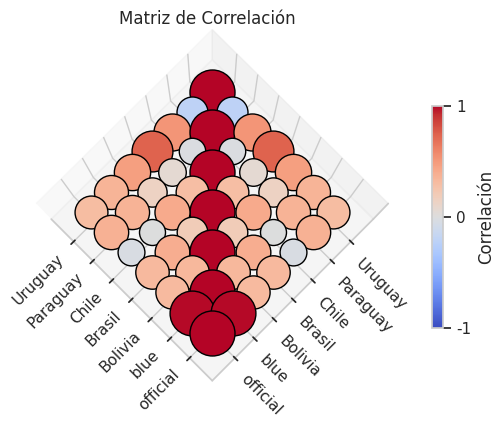

In [ ]:
# Calcular la matriz de correlación
corr = merged.corr()

# Obtener las coordenadas (x, y, z) para las esferas
x, y = np.meshgrid(range(corr.shape[0]), range(corr.shape[1]))
z = np.zeros_like(x)

# Obtener los valores de correlación
correlation_values = corr.values.flatten()

# Configurar la figura de matplotlib en 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Obtener los tamaños de las esferas de acuerdo a las correlaciones
sizes = np.abs(correlation_values) + 0.5  # Agregar 0.5 para asegurar que las correlaciones nulas sean visibles

# Crear las esferas para cada correlación con una escala de colores
norm = plt.Normalize(-1, 1) 
cmap = cm.get_cmap('coolwarm') 
colors = cmap(norm(correlation_values))

# Crear las esferas para cada correlación con su color y tamaño correspondientes
for i, (xi, yi, zi) in enumerate(zip(x.flatten(), y.flatten(), z.flatten())):
    correlation = correlation_values[i]
    color = colors[i]
    size = sizes[i]
    ax.scatter(xi, yi, zi, color=color, s=size * 700, edgecolor='black')

# Configurar los límites y etiquetas de los ejes
ax.set_xlim([-1, corr.shape[0]])
ax.set_ylim([-1, corr.shape[1]])

# Ajustar el rango del eje z
z_range = np.nanmax(np.abs(correlation_values))
ax.set_zlim([-z_range, z_range])
ax.set_xticks(range(corr.shape[0]))
ax.set_yticks(range(corr.shape[1]))
ax.set_zticks([])
ax.set_xticklabels(corr.columns, ha='right', va='center', rotation=45, rotation_mode='anchor')
ax.set_yticklabels(corr.columns, ha='right', va='top', rotation=-45, rotation_mode='anchor')

# Ajustar la inclinación del gráfico
ax.view_init(elev=-95, azim=45) 

# Agregar la barra de leyenda
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array(correlation_values)
cbar = fig.colorbar(mappable, pad=0.08, shrink=0.6, ticks=[-1, 0, 1])
cbar.set_label('Correlación')
cbar.ax.yaxis.set_major_locator(FixedLocator([-1, 0, 1])) 
cbar.ax.yaxis.set_major_formatter(FixedFormatter(['-1', '0', '1']))

# Ajustar la posición de los tick labels en el eje x y eje y
for tick_label_x, tick_label_y in zip(ax.xaxis.get_majorticklabels(), ax.yaxis.get_majorticklabels()):
    tick_label_x.set_bbox({'facecolor': 'white', 'pad': 0.1, 'edgecolor': 'none'}) 
    tick_label_x.set_horizontalalignment('right')  

    tick_label_y.set_bbox({'facecolor': 'white', 'pad': 0.1, 'edgecolor': 'none'}) 
    tick_label_y.set_horizontalalignment('left') 
# agregar titulo
plt.title('Matriz de Correlación')

clear_output()
plt.show()

Este gráfico se asimila a un mapa de calor, donde nos permite ver la correlación que hay entre las distintas columnas de nuestro dataframe.

De aqui podemos interpretar varias cosas. Por ejemplo:
- El valor del dolar oficial y blue estan altamente relacionados. (Como es de esoerar)
- La relación entre Paraguay y Uruguay es negativa. Significa que cuando turistas de Paraguay visitan Argentina, los turistas Uruguayos no lo hacen, y viceversa. Este coportamiento se llega a apreciar en el mapa anterior. Es defícil establecer la razón con los datos con los que contamos.
- Turistas de Chile, Paraguay y Brasil suelen visitar Argentina en temporadas similares. Se puede asumir que por las temporadas de vacaciones, y no demasiado al valor del dolar.
- La correlación de Chile con el valor del dolar es muy baja, por lo que el valor del dolar no es motivo de turismo para Chile en Argentina.

## Exportación Parquet
Para finalizar, exportamos en dataframe `merged` a formato parquet.

Si bien fue utilizado un segundo dataframe `transformed_countries` este fue creado para el proposito específico de crear un mapa, y es derivado de `merged`. Por lo tanto, solo exportaremos `merged`.

Notar que el archivo se guardara en el sistema de archivo de Google Colab en la ruta especificada.

In [ ]:
output_directory = '/content/parquet'

if not os.path.exists(output_directory):
    os.makedirs(output_directory)

output_file = os.path.join(output_directory, 'turistas.parquet')

merged.to_parquet(output_file)